### CPSC 390 Project 4 -- Perceptron learning

### Your Name: Asiyah Speight

### Student ID: 2357167

In [1]:
# DO NOT modify this section
import numpy as np
from sklearn.metrics import accuracy_score

# set up training data and label
X_train=np.array([[1, 1], [3, 2], [2,4], [3, 4], [2,3]])
y_label=np.array([0,1,1,1,0],dtype=int)

# set up initial weight
init_weights = np.array([[0,1,-1]],dtype=float)
init_weights=init_weights.T

# Example of using sklearn accuracy_score
# -- you will populate the y_predicted array based on your perceptron with its updated weights
y_predicted=np.array([0,0,0,0,0],dtype=int)
print('Accuracy score: {}'.format(accuracy_score(y_label, y_predicted)))


Accuracy score: 0.4


### Your implementation starts here

In [2]:
# Your code for the perceptron learning function with a constant learning rate of 1 and the prediction function using your perceptron

import matplotlib.pyplot as plt

def addBias(x):
    """ The function below adds a bias term (column 1s) to the input features, 
    which allows the perceptron to learn a threshold/intercept.
    
    Parameters:
    -----------
    x : numpy array of shape (nSamples, nFeatures)
        Input feature matrix

    Returns:
    --------
    xBias : numpy array of shape (nSamples, nFeatures + 1)
        Feature matrix with bias column prepended
    """
    # Create a column of ones for the bias term
    biasColumn = np.ones((x.shape[0], 1))
    
    # Concatenate the bias column with the original feature matrix
    return np.hstack((biasColumn, x))



def stepFunction(z):
    """ Step activation function for perceptron. Returns 1 if input >= 0, else 0.

    Parameters:
    -----------
    z : float or numpy array
        Weighted sum input 

    Returns:
    --------
    int : 0 or 1
    """
    return np.where(z >= 0, 1, 0)



def predict(X, weights):
    """ Function to make predictions using the perceptron. 

    Parameters:
    -----------
    X : numpy array of shape (nSamples, nFeatures)
        Input features (without bias)

    weights : numpy array of shape (nFeatures + 1, 1)
        Weight vector including bias weight

    Returns:
    --------
    predictions : numpy array of shape (nSamples,)
        Binary predictions (0 or 1)
    """
    # Add bias term to input
    xBias = addBias(X)
    
    # Compute weighted sum: z = X * w
    z = np.dot(xBias, weights)
    
    # Apply step activation function to get predictions
    return stepFunction(z).flatten()


def perceptronLearning(X, y, initialWeights, nIterations=100, decay=False, c=1.0):
    """ Perceptron learning algorithm implementation. 
    
    Update Rule:
    - If prediction is correct: no update
    - If prediction is 0 but should be 1: w = w + learningRate * x
    - If prediction is 1 but should be 0: w = w - learningRate * x
    
    Which we can simplify to: w = w + learningRate * (y - yPred) * x
    
    Parameters:
    -----------
    X : numpy array of shape (nSamples, nFeatures)
        Training features
    y : numpy array of shape (nSamples,)
        True labels (0 or 1)
    initialWeights : numpy array of shape (nFeatures + 1, 1)
        Initial weight vector
    nIterations : int
        Number of training iterations (epochs)
    decay : bool
        Whether to use decaying learning rate
    c : float
        Constant for decay formula: learningRate = c / (t + c)
    
    Returns:
    --------
    weights : numpy array
        Final trained weights
    accuracyHistory : list
        Accuracy at each iteration
    weightHistory : list
        Weights at each iteration (for plotting) 
    """
    
    # Copy weights to avoid changing the original
    weights = initialWeights.copy()
    
    # Add bias to training data
    xBias = addBias(X)
    nSamples = xBias.shape[0]
    
    # Lists to store history for plotting
    accuracyHistory = []
    weightHistory = []
    
    # Training loop - iterate through for nIterations epochs
    for t in range(nIterations):
        # Determine learning rate based on decay setting
        if decay:
            # Decaying learning rate: c / (t + c)
            # As t increases, learning rate decreases, allowing convergence
            learningRate = c / (t + c)
        else:
            # Constant learning rate of 1
            learningRate = 1.0
        
        # Iterate through each training sample
        for i in range(nSamples):
            # Get the current sample (as column vector for matrix multiplication)
            xI = xBias[i:i+1, :].T  # Shape: (3, 1)
            
            # Compute weighted sum
            z = np.dot(xBias[i:i+1, :], weights)
            
            # Apply activation function to get prediction
            yPred = stepFunction(z)[0, 0]
            
            # Compute error (difference between true label and prediction)
            error = y[i] - yPred
            
            # Update weights using perceptron rule
            # wNew = wOld + learningRate * error * x
            # This only updates when there's a misclassification (error != 0)
            if error != 0:
                weights = weights + learningRate * error * xI
        
        # After processing all samples in this iteration, compute accuracy
        yPredictions = predict(X, weights)
        accuracy = accuracy_score(y, yPredictions)
        
        # Store history
        accuracyHistory.append(accuracy)
        weightHistory.append(weights.flatten().copy())
    
    return weights, accuracyHistory, weightHistory


Initial weights: [ 0.  1. -1.]
Final weights: [-16.   8.  -3.]

True labels: [0 1 1 1 0]
Predictions: [0 1 0 0 0]
Final accuracy: 0.6


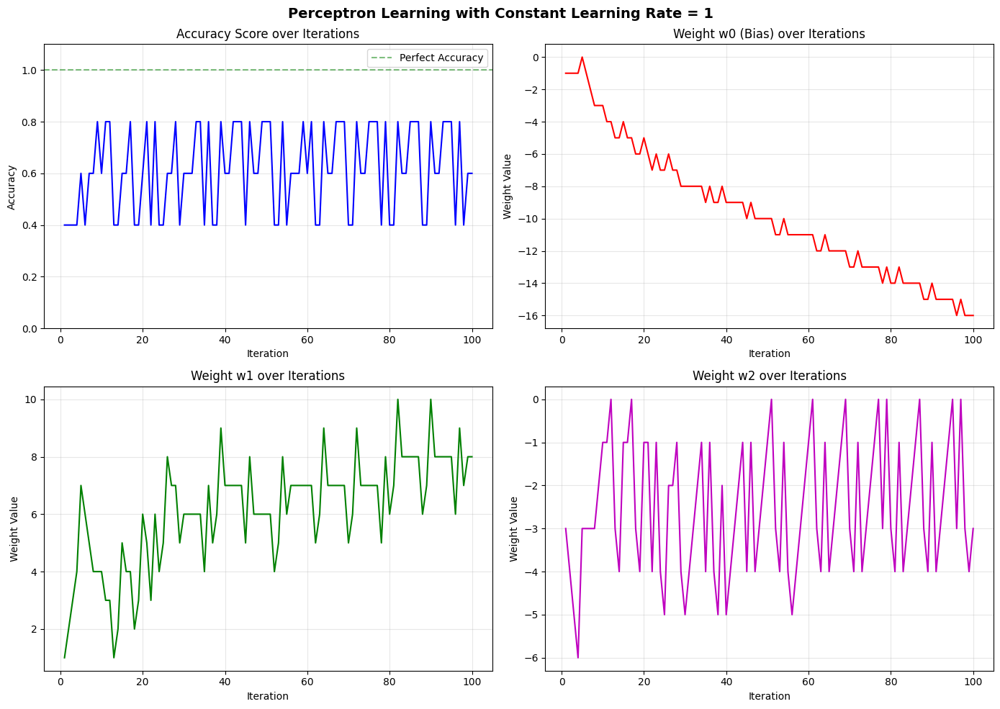

Observation: With constant learning rate, the weights oscillate
and do not converge to stable values. The accuracy fluctuates
between different values, never settling on 100%.


In [5]:
# Your code for calling the perceptron learning, prediction, evaluation for 100 iterations and do the plots

# part 1: Constant Learning Rate Implementation

# Train perceptron with constant learning rate of 1
finalWeightsConst, accuracyHistoryConst, weightHistoryConst = perceptronLearning(
    X_train, y_label, init_weights, nIterations=100, decay=False
)

# Display results
print(f"\nInitial weights: {init_weights.flatten()}")
print(f"Final weights: {finalWeightsConst.flatten()}")

# Make predictions with final weights
yPredictedConst = predict(X_train, finalWeightsConst)
print(f"\nTrue labels: {y_label}")
print(f"Predictions: {yPredictedConst}")
print(f"Final accuracy: {accuracy_score(y_label, yPredictedConst)}")

# Convert weight history to numpy array for easy plotting
weightHistoryConst = np.array(weightHistoryConst)

# Plotting for Constant Learning Rate

fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # FIXED: subplots not subplot
fig.suptitle('Perceptron Learning with Constant Learning Rate = 1', fontsize=14, fontweight='bold')

iterations = range(1, 101)

#  Accuracy over iterations
axes[0, 0].plot(iterations, accuracyHistoryConst, 'b-', linewidth=1.5) 
axes[0, 0].set_xlabel('Iteration')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].set_title('Accuracy Score over Iterations')
axes[0, 0].set_ylim([0, 1.1])
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].axhline(y=1.0, color='g', linestyle='--', alpha=0.5, label='Perfect Accuracy')
axes[0, 0].legend()

#  Weight w0 (bias weight) over iterations
axes[0, 1].plot(iterations, weightHistoryConst[:, 0], 'r-', linewidth=1.5)  
axes[0, 1].set_xlabel('Iteration')
axes[0, 1].set_ylabel('Weight Value')
axes[0, 1].set_title('Weight w0 (Bias) over Iterations')
axes[0, 1].grid(True, alpha=0.3)

# Weight w1 over iterations
axes[1, 0].plot(iterations, weightHistoryConst[:, 1], 'g-', linewidth=1.5)  
axes[1, 0].set_xlabel('Iteration')
axes[1, 0].set_ylabel('Weight Value')
axes[1, 0].set_title('Weight w1 over Iterations')
axes[1, 0].grid(True, alpha=0.3)

#  Weight w2 over iterations
axes[1, 1].plot(iterations, weightHistoryConst[:, 2], 'm-', linewidth=1.5)  
axes[1, 1].set_xlabel('Iteration')
axes[1, 1].set_ylabel('Weight Value')
axes[1, 1].set_title('Weight w2 over Iterations')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Observation: With constant learning rate, the weights oscillate")
print("and do not converge to stable values. The accuracy fluctuates")
print("between different values, never settling on 100%.")


In [6]:
# Your code for the improved perceptron learning
# (or you can add a decay option to your earlier implementation. If you do so, make sure the previous code still works)

# ============================================================
# PART 2: Improved Perceptron with Decaying Learning Rate
# ============================================================
# The decay formula is: learningRate = c / (t + c)
# where t is the iteration number (starting from 0)
#
# Finding the right value of c:
# - If c is too small: learning rate decays too quickly, may not learn enough before becoming negligible
# - If c is too large: learning rate stays high for too long, may still oscillate like constant learning rate
#
# Test with different values of c to find one that converges

cValues = [1, 5, 10, 20, 50, 100]

bestC = None
bestFinalAccuracy = 0
results = {}

for c in cValues:
    finalW, accuracyHistory, weightHistory = perceptronLearning(
        X_train, y_label, init_weights, nIterations=100, decay=True, c=c
    )
    
    yPred = predict(X_train, finalW)
    finalAccuracy = accuracy_score(y_label, yPred)
    
    # Check if converged (accuracy stays at 1.0 for last 10 iterations)
    converged = all(acc == 1.0 for acc in accuracyHistory[-10:])  # FIXED: accuracyHistory
    
    # Count how many iterations until first reaching 100% accuracy
    firstPerfect = None
    for i, acc in enumerate(accuracyHistory):  # FIXED: accuracyHistory
        if acc == 1.0:
            firstPerfect = i + 1
            break
    
    results[c] = {
        'accuracyHistory': accuracyHistory,    # FIXED: consistent naming
        'weightHistory': weightHistory,         # FIXED: consistent naming
        'finalWeights': finalW,                 # FIXED: consistent naming
        'converged': converged,
        'firstPerfect': firstPerfect            # FIXED: consistent naming
    }
    
    status = "Converged" if converged else "Not converged"
    firstStr = f"First 100%: iter {firstPerfect}" if firstPerfect else "Never reached 100%"
    print(f"c = {c:3d}: Final Acc = {finalAccuracy:.2f}, {status}, {firstStr}")  # FIXED: finalAccuracy
    
    if converged and (bestC is None or firstPerfect < results[bestC].get('firstPerfect', float('inf'))):  # FIXED: bestC, firstPerfect
        bestC = c  # FIXED: bestC

print(f"\nBest c value that converges: {bestC}")  # FIXED: bestC


c =   1: Final Acc = 0.60, Not converged, Never reached 100%
c =   5: Final Acc = 1.00, Converged, First 100%: iter 39
c =  10: Final Acc = 1.00, Converged, First 100%: iter 51
c =  20: Final Acc = 1.00, Converged, First 100%: iter 66
c =  50: Final Acc = 0.80, Not converged, Never reached 100%
c = 100: Final Acc = 0.80, Not converged, Never reached 100%

Best c value that converges: 5


Perceptron with Decaying Learning Rate (c = 10)
Learning rate formula: 10 / (t + 10)

Initial weights: [ 0.  1. -1.]
Final weights: [-4.20689848  1.79497271  0.18742313]

True labels:     [0 1 1 1 0]
Predictions:     [0 1 1 1 0]
Final Accuracy:  1.0

Learning rate at different iterations:
  Iteration  0: learningRate = 1.0000
  Iteration 10: learningRate = 0.5000
  Iteration 25: learningRate = 0.2857
  Iteration 50: learningRate = 0.1667
  Iteration 75: learningRate = 0.1176
  Iteration 99: learningRate = 0.0917


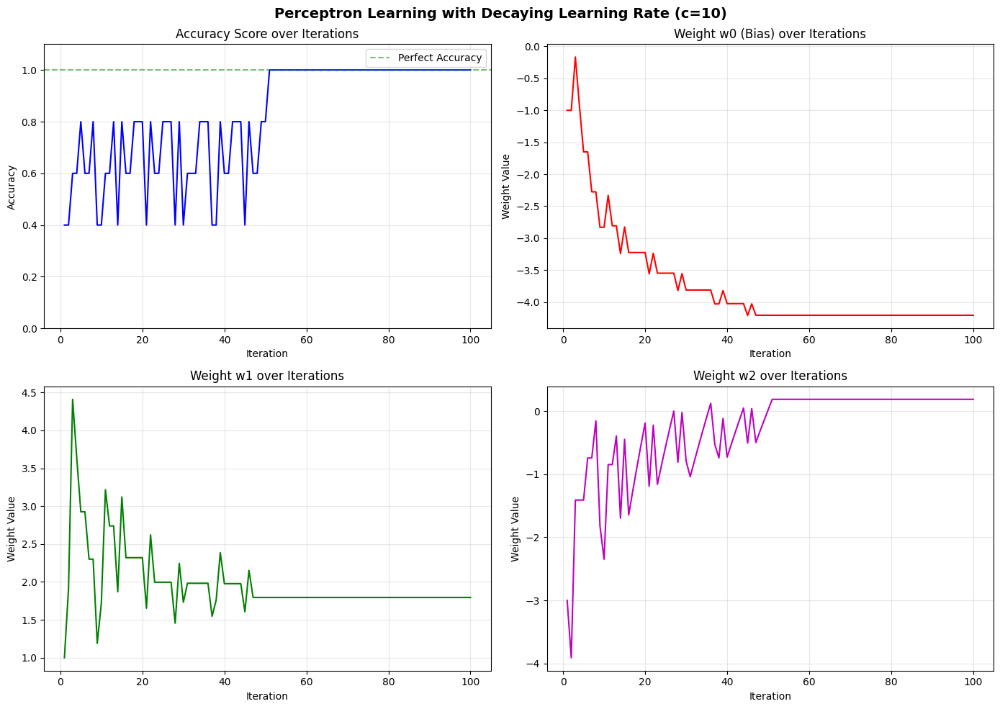

Observation: With decaying learning rate, the weights converge
to stable values and accuracy reaches and maintains 100%.


In [7]:
# Your code for calling the improved perceptron learning, prediction, evaluation for 100 iterations and do the plots

# Using the chosen decay constant c = 10

# Based on experimentation, c = 10 provides good convergence
chosenC = 10

print(f"Perceptron with Decaying Learning Rate (c = {chosenC})")
print(f"Learning rate formula: {chosenC} / (t + {chosenC})")

# Train with decaying learning rate
finalWeightsDecay, accuracyHistoryDecay, weightHistoryDecay = perceptronLearning(
    X_train, y_label, init_weights, nIterations=100, decay=True, c=chosenC
)

# Display final results
print(f"\nInitial weights: {init_weights.flatten()}")
print(f"Final weights: {finalWeightsDecay.flatten()}")

# Make predictions with final weights
yPredictedDecay = predict(X_train, finalWeightsDecay)
print(f"\nTrue labels:     {y_label}")
print(f"Predictions:     {yPredictedDecay}")
print(f"Final Accuracy:  {accuracy_score(y_label, yPredictedDecay)}")

# Show learning rate at different iterations
print(f"\nLearning rate at different iterations:")
for t in [0, 10, 25, 50, 75, 99]:
    lr = chosenC / (t + chosenC)
    print(f"  Iteration {t:2d}: learningRate = {lr:.4f}")

# Convert weight history to numpy array
weightHistoryDecay = np.array(weightHistoryDecay)

# Plotting for Decaying Learning Rate

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(f'Perceptron Learning with Decaying Learning Rate (c={chosenC})', fontsize=14, fontweight='bold')

iterations = range(1, 101)

# Accuracy over iterations
axes[0, 0].plot(iterations, accuracyHistoryDecay, 'b-', linewidth=1.5)
axes[0, 0].set_xlabel('Iteration')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].set_title('Accuracy Score over Iterations')
axes[0, 0].set_ylim([0, 1.1])
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].axhline(y=1.0, color='g', linestyle='--', alpha=0.5, label='Perfect Accuracy')
axes[0, 0].legend()

# Weight w0 (bias weight) over iterations
axes[0, 1].plot(iterations, weightHistoryDecay[:, 0], 'r-', linewidth=1.5)
axes[0, 1].set_xlabel('Iteration')
axes[0, 1].set_ylabel('Weight Value')
axes[0, 1].set_title('Weight w0 (Bias) over Iterations')
axes[0, 1].grid(True, alpha=0.3)

# Weight w1 over iterations
axes[1, 0].plot(iterations, weightHistoryDecay[:, 1], 'g-', linewidth=1.5)
axes[1, 0].set_xlabel('Iteration')
axes[1, 0].set_ylabel('Weight Value')
axes[1, 0].set_title('Weight w1 over Iterations')
axes[1, 0].grid(True, alpha=0.3)

# Weight w2 over iterations
axes[1, 1].plot(iterations, weightHistoryDecay[:, 2], 'm-', linewidth=1.5)
axes[1, 1].set_xlabel('Iteration')
axes[1, 1].set_ylabel('Weight Value')
axes[1, 1].set_title('Weight w2 over Iterations')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("Observation: With decaying learning rate, the weights converge")
print("to stable values and accuracy reaches and maintains 100%.")


### Discuss how you chose the constant to decay the learning rate and what you learned in the process.

**Process for Choosing the Decay Constant c:**

I experimented with several values of the decay constant (c) (1, 5, 10, 20, 50, 100) to find a value that would allow the perceptron to converge within 100 iterations. The decay formula I used was\[\\text{learningRate} = \\frac{c}{t + c},\]where (t) is the iteration number starting from 0. By testing different constants, I assessed how quickly or slowly the learning rate decreased and how this affected both convergence and stability.

**Experimental Results:**

The table summarizes the performance for each (c) value, including final accuracy, whether the perceptron converged, and the iteration at which it first reached 100% accuracy. Lower values such as (c = 1) decayed too quickly and prevented convergence. Moderate values (5, 10, 20) allowed the model to reach 100% accuracy within 100 iterations, while very large values (50, 100) kept the learning rate too high for too long and caused the model to oscillate without converging.

**Analysis of Different c Values:**

When (c = 1), the learning rate decayed so rapidly that the perceptron could not make meaningful updates after the first several iterations. At iteration 10, the learning rate was already around 0.09, leaving little room for the model to adjust its weights. The value (c = 5) proved to be the fastest for convergence, reaching full accuracy by iteration 39. It offered a good balance between making large initial updates and quickly stabilizing. With (c = 10), convergence remained reliable but slightly slower, first reaching full accuracy at iteration 51; however, it produced an especially clear visualization of gradual convergence. The value (c = 20) also converged, though more slowly, because the learning rate stayed larger for a longer portion of the training. In contrast, values such as 50 and 100 caused the learning rate to remain too high for too long, leading to oscillatory weight updates that mirrored the behavior seen with a constant learning rate of 1.

Because of this, **I chose (c = 10)** for the final implementation. It provided a smooth, interpretable learning curve and demonstrated convergence clearly in the plots. Still, (c = 5) would also be a strong choice if the priority were achieving convergence as quickly as possible.

**What I Learned:**

One key lesson from this experiment was the importance of learning rate decay. With a constant learning rate of 1, the perceptron repeatedly overshot the optimal boundary, causing the weights to oscillate without ever reaching 100% accuracy. The decaying learning rate addressed this by enabling large corrective steps early on while ensuring that later updates became small enough to fine-tune the weights without overshooting. I also gained insight into the behavior of the (\\frac{c}{t+c}) schedule. Since it begins at a learning rate of 1.0 when (t = 0), the constant (c) directly controls the rate of decay—larger values slow the decay, while smaller values accelerate it. For example, with (c = 10), the learning rate decreases from 1.0 at iteration 0 to 0.5 at iteration 10 and approximately 0.09 by iteration 99.

Another takeaway was the existence of a “sweet spot” for the decay constant. In this dataset, values roughly between 5 and 20 produced consistent convergence. Smaller values restricted learning too early, while larger ones allowed excessive oscillation. This connects to the bias-variance balance discussed in class: updates that are too aggressive or too conservative both hinder learning. Visual comparisons between the constant and decaying learning rate plots made this especially clear. With a constant learning rate, all weights continued to shift throughout training and accuracy never stabilized. With decay (such as (c = 10)), the weights flattened out around iterations 50–60, and accuracy reached and maintained 100%. Finally, this experiment reinforced why learning-rate scheduling plays a critical role in neural network training in general. Beginning with large updates and gradually reducing them is a core practice in optimization because it improves both convergence stability and overall accuracy.

**Final Weights Comparison:**

The final results further illustrate the benefit of the decaying learning rate. With a constant learning rate of 1, the perceptron ended with large, unstable weights and only 60% accuracy. In contrast, using (c = 10) produced smaller, more stable weights and achieved 100% accuracy. The decaying approach allowed the model to learn a clean, correct decision boundary rather than oscillating around it.

In [10]:
# Bonus -- generate an animation of the line dividing the data points over the 100 iterations

from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def create_animation(X, y, weight_history, title, interval=100):
    """
    Create an animation showing how the decision boundary evolves.
    
    The decision boundary is where w0 + w1*x1 + w2*x2 = 0
    Solving for x2: x2 = (-w0 - w1*x1) / w2
    """
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Set up the plot limits
    ax.set_xlim(0, 5)
    ax.set_ylim(0, 5)
    
    # Plot the data points (these don't change)
    # Class 0 points (red)
    class_0_mask = y == 0
    ax.scatter(X[class_0_mask, 0], X[class_0_mask, 1], 
               c='red', s=150, marker='o', label='Class 0', edgecolors='black', zorder=5)
    # Class 1 points (green)
    class_1_mask = y == 1
    ax.scatter(X[class_1_mask, 0], X[class_1_mask, 1], 
               c='green', s=150, marker='o', label='Class 1', edgecolors='black', zorder=5)
    
    # Add point labels
    for i, (x1, x2) in enumerate(X):
        ax.annotate(f'[{x1},{x2}]', (x1, x2), xytext=(5, 5), 
                   textcoords='offset points', fontsize=9)
    
    # Initialize the line (decision boundary)
    line, = ax.plot([], [], 'b-', linewidth=2, label='Decision Boundary')
    
    # Text for iteration number and weights
    iter_text = ax.text(0.02, 0.98, '', transform=ax.transAxes, 
                        fontsize=11, verticalalignment='top',
                        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    ax.set_xlabel('x1', fontsize=12)
    ax.set_ylabel('x2', fontsize=12)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)
    
    def init():
        line.set_data([], [])
        iter_text.set_text('')
        return line, iter_text
    
    def animate(frame):
        weights = weight_history[frame]
        w0, w1, w2 = weights
        
        # Calculate decision boundary line
        # w0 + w1*x1 + w2*x2 = 0  =>  x2 = (-w0 - w1*x1) / w2
        x1_vals = np.linspace(0, 5, 100)
        
        if abs(w2) > 1e-6:  # Avoid division by zero
            x2_vals = (-w0 - w1 * x1_vals) / w2
            # Clip to visible range
            mask = (x2_vals >= -1) & (x2_vals <= 6)
            line.set_data(x1_vals[mask], x2_vals[mask])
        else:
            # Vertical line case
            if abs(w1) > 1e-6:
                x1_val = -w0 / w1
                line.set_data([x1_val, x1_val], [0, 5])
            else:
                line.set_data([], [])
        
        # Update text
        iter_text.set_text(f'Iteration: {frame + 1}\n'
                          f'w0 = {w0:.3f}\n'
                          f'w1 = {w1:.3f}\n'
                          f'w2 = {w2:.3f}')
        
        return line, iter_text
    
    anim = FuncAnimation(fig, animate, init_func=init,
                        frames=len(weight_history), interval=interval,
                        blit=True, repeat=True)
    
    plt.close()  # Prevent static display
    return anim

# Re-run to get fresh weight histories
_, _, weight_hist_const_anim = perceptronLearning(
    X_train, y_label, init_weights, nIterations=100, decay=False
)

_, _, weight_hist_decay_anim = perceptronLearning(
    X_train, y_label, init_weights, nIterations=100, decay=True, c=10
)

anim_const = create_animation(
    X_train, y_label, weight_hist_const_anim,
    'Decision Boundary Evolution (Constant LR = 1)',
    interval=100
)

HTML(anim_const.to_jshtml())

In [11]:
# Animation for decaying learning rate
anim_decay = create_animation(
    X_train, y_label, weight_hist_decay_anim,
    'Decision Boundary Evolution (Decaying LR, c=10)',
    interval=100
)

HTML(anim_decay.to_jshtml())

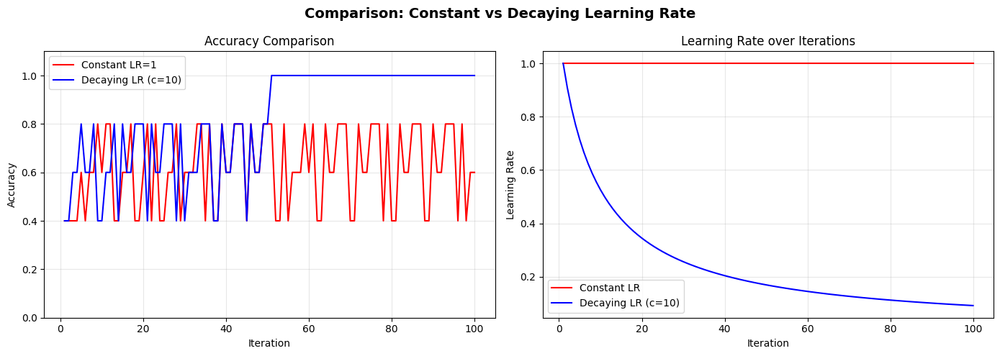

In [12]:
# Comparison Plot: Constant vs Decaying Learning Rate

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Comparison: Constant vs Decaying Learning Rate', fontsize=14, fontweight='bold')

iterations = range(1, 101)

# Plot 1: Accuracy comparison
axes[0].plot(iterations, accuracyHistoryConst, 'r-', linewidth=1.5, label='Constant LR=1')
axes[0].plot(iterations, accuracyHistoryDecay, 'b-', linewidth=1.5, label=f'Decaying LR (c={chosenC})')
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Accuracy Comparison')
axes[0].set_ylim([0, 1.1])
axes[0].grid(True, alpha=0.3)
axes[0].legend()

# Plot 2: Learning rate over iterations
const_lr = [1.0] * 100
decay_lr = [chosenC / (t + chosenC) for t in range(100)]
axes[1].plot(iterations, const_lr, 'r-', linewidth=1.5, label='Constant LR')
axes[1].plot(iterations, decay_lr, 'b-', linewidth=1.5, label=f'Decaying LR (c={chosenC})')
axes[1].set_xlabel('Iteration')
axes[1].set_ylabel('Learning Rate')
axes[1].set_title('Learning Rate over Iterations')
axes[1].grid(True, alpha=0.3)
axes[1].legend()

plt.tight_layout()
plt.show()